# Name: Hanan Fared Mohamed Omara , ID =  20398559

# Data Science LifeCycle
- Business Understanding 
- Load Dataset
- Data Preprataion
  - Check duplication
  - Check null
  - check unique features
  - visulize data
-Modeling
- Model Evaluation and tuning with transfer learning

## Project Description

In this project, we will use the Fashion-MNIST dataset using a CNN neural 
network architecture.

---

Most of details about `fashion-mnist` data comes from the official documentation: https://github.com/zalandoresearch/fashion-mnist

## Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

from sklearn.model_selection import train_test_split, KFold

import tensorflow as tf
from keras.utils import plot_model
from keras.models import Sequential, Model
from keras.layers import Conv2D, Dense, Flatten, Dropout, MaxPool2D, Input, Concatenate, GlobalMaxPooling2D
from keras.optimizers import Adam, schedules
from keras.losses import SparseCategoricalCrossentropy
from keras.callbacks import EarlyStopping, LearningRateScheduler

!pip install -q -U keras-tuner
import keras_tuner as kt

seed = 72
img_size_target = 32
tf.random.set_seed(seed)

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tfx-bsl 1.12.0 requires google-api-python-client<2,>=1.7.11, but you have google-api-python-client 2.83.0 which is incompatible.
onnx 1.13.1 requires protobuf<4,>=3.20.2, but you have protobuf 3.19.6 which is incompatible.
apache-beam 2.44.0 requires dill<0.3.2,>=0.3.1.1, but you have dill 0.3.6 which is incompatible.


## Data

### Read Data

In [2]:
train = pd.read_csv('/kaggle/input/fashionmnist/fashion-mnist_train.csv')

In [3]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60000 entries, 0 to 59999
Columns: 785 entries, label to pixel784
dtypes: int64(785)
memory usage: 359.3 MB


In [4]:
train.describe()

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
count,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,...,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.00000
mean,4.500000,0.000900,0.006150,0.035333,0.101933,0.247967,0.411467,0.805767,2.198283,5.682000,...,34.625400,23.300683,16.588267,17.869433,22.814817,17.911483,8.520633,2.753300,0.855517,0.07025
std,2.872305,0.094689,0.271011,1.222324,2.452871,4.306912,5.836188,8.215169,14.093378,23.819481,...,57.545242,48.854427,41.979611,43.966032,51.830477,45.149388,29.614859,17.397652,9.356960,2.12587
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
25%,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
50%,4.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
75%,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,58.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
max,9.000000,16.000000,36.000000,226.000000,164.000000,227.000000,230.000000,224.000000,255.000000,254.000000,...,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,170.00000


### Data Visualization

<AxesSubplot:>

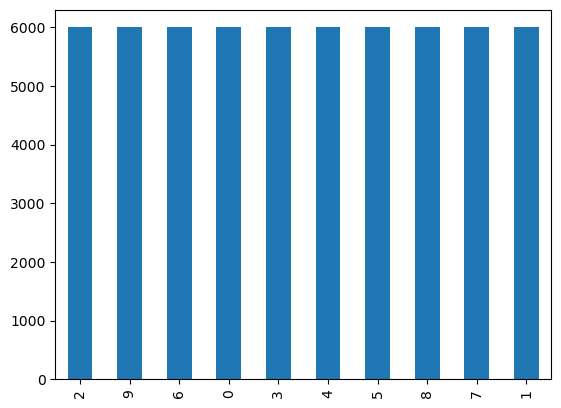

In [5]:
train.label.value_counts().plot(kind='bar')

### Check Missing Values
it seems that there is no missing values

In [6]:
# data has no nulls
train.isnull().sum().sum()

0

### Check Duplicates
it seems that there is 43 duplicates

In [7]:
# data has no duplicated rows
train.duplicated().sum()

43

### show correlation

In [8]:
# check the correlation between all features to benefits of it if there is any high correlation between features
corr = train.corr()
corr

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
label,1.000000,-0.000674,0.002944,-0.010439,-0.007111,-0.004632,-0.011045,-0.036765,-0.085211,-0.161552,...,-0.362614,-0.258380,-0.183131,-0.090568,-0.077340,-0.066936,-0.018038,0.045598,0.059960,0.021772
pixel1,-0.000674,1.000000,0.297899,0.067550,0.046608,0.026630,0.026172,0.012095,0.012218,0.009637,...,-0.000642,0.004625,0.004605,0.000969,-0.002306,-0.002441,-0.000108,0.008765,0.026389,0.041582
pixel2,0.002944,0.297899,1.000000,0.575029,0.138710,0.054354,0.033185,0.022763,0.017127,0.016809,...,0.000492,0.004857,0.006811,0.002083,-0.004431,-0.002342,0.004273,0.014218,0.021297,0.022162
pixel3,-0.010439,0.067550,0.575029,1.000000,0.387466,0.118135,0.087300,0.060927,0.035920,0.029712,...,0.010131,0.016743,0.018358,0.006171,-0.003825,-0.001501,0.006860,0.013152,0.009946,0.015657
pixel4,-0.007111,0.046608,0.138710,0.387466,1.000000,0.573172,0.325684,0.242954,0.140955,0.085253,...,0.009684,0.018697,0.023373,0.016718,0.009681,0.010095,0.023942,0.012392,0.003075,0.008423
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
pixel780,-0.066936,-0.002441,-0.002342,-0.001501,0.010095,0.021505,0.032305,0.027024,0.019414,0.024837,...,-0.074375,-0.009124,0.042812,0.336699,0.790103,1.000000,0.749528,0.349021,0.178599,0.073398
pixel781,-0.018038,-0.000108,0.004273,0.006860,0.023942,0.025974,0.038563,0.030464,0.026227,0.034158,...,-0.042349,0.008555,0.045394,0.130783,0.439260,0.749528,1.000000,0.645809,0.334519,0.133817
pixel782,0.045598,0.008765,0.014218,0.013152,0.012392,0.028863,0.044121,0.029457,0.022724,0.020953,...,-0.002807,0.034069,0.073942,0.092657,0.152471,0.349021,0.645809,1.000000,0.658962,0.225502
pixel783,0.059960,0.026389,0.021297,0.009946,0.003075,0.022941,0.030806,0.016126,0.005938,0.000074,...,0.001898,0.026530,0.054193,0.077633,0.101066,0.178599,0.334519,0.658962,1.000000,0.451929


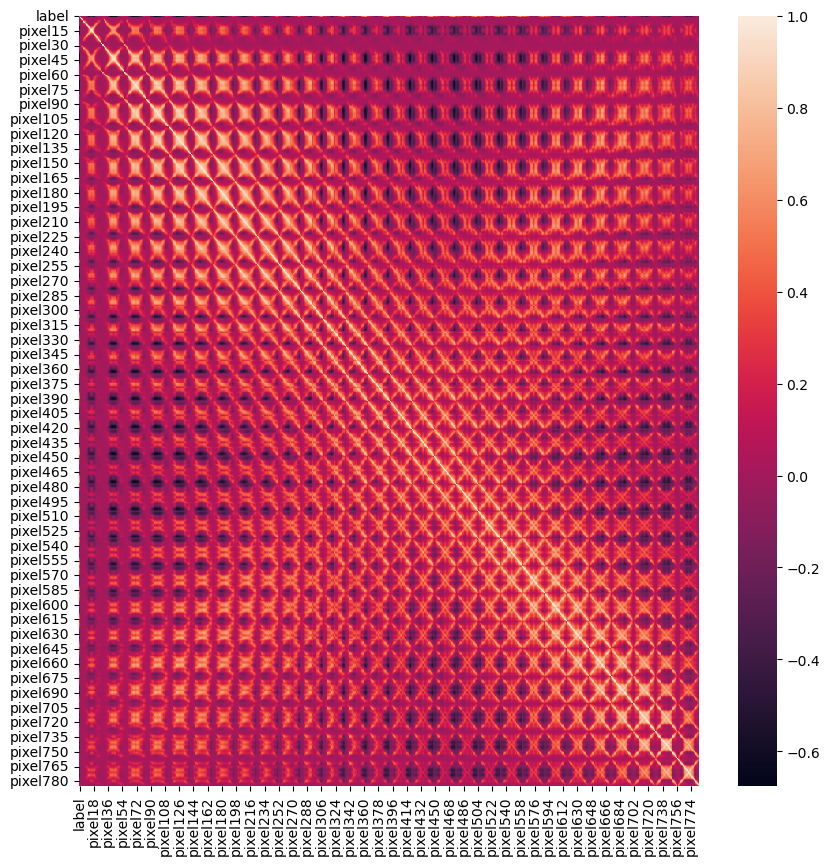

In [9]:
# setting the dimensions of the plot
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10, 10))
# drawing the plot
sns.heatmap(corr)
plt.show()

### Preprocessing


### Remove Duplicates

In [11]:
train.drop_duplicates(inplace=True)

### Split Data to train and test

In [12]:
# split to features and label
data = np.asarray(train, dtype=np.float32)
X = data[:, 1:]
y = data[:, 0]

### Reshape data
Convert data from columns form to image matrix 28×28 form
then add padding to be 32×32 because it is the minimum acceptable image size for pretrained models.

In [13]:
# reshape to 28×28
X = X.reshape(-1, 28, 28)
# add padding
X = tf.pad(X, [[0, 0], [2, 2], [2, 2]])
# add the channels dimention so it will become (..., 32, 32, 1) instead of (..., 32, 32)
X = tf.expand_dims(X, axis=3, name=None).numpy()
X.shape

(59957, 32, 32, 1)

### Normalization
dividing by 255

In [14]:
X = X / 255

#### Labels
Each training and test example is assigned to one of the following labels:

| Label | Description |
| --- | --- |
| 0 | T-shirt/top |
| 1 | Trouser |
| 2 | Pullover |
| 3 | Dress |
| 4 | Coat |
| 5 | Sandal |
| 6 | Shirt |
| 7 | Sneaker |
| 8 | Bag |
| 9 | Ankle boot |



In [15]:
lebels = ['T_shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

### Spite the data
splite the data to training and testing sets.

In [16]:
# split to training and validation
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05, shuffle=True, stratify=y, random_state=seed)

### Display some Images

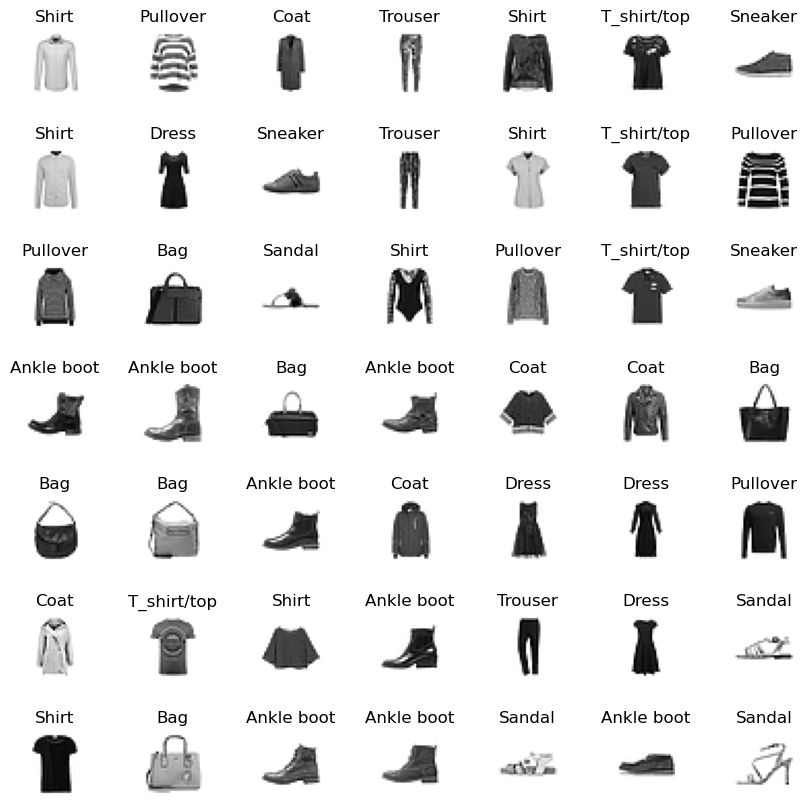

In [17]:
plt.figure(figsize=(10,10))

for index in range(49):
    plt.subplot(7, 7, index+1)
    plt.imshow(X_train[index], cmap='binary')
    plt.title(lebels[int(y_train[index])])
    plt.axis('off')
plt.subplots_adjust(hspace=0.7, wspace=0.8)
plt.show()

## LeNet 5 Model
implement a LeNet-5 network to recognize the Fashion-MNIST.

The LeNet 5 Architecture:

![LeNet 5](https://blog.paperspace.com/content/images/2021/10/image-17.png)

(Source: http://yann.lecun.com/exdb/publis/pdf/lecun-01a.pdf)

The LeNet 5 Convolution Operation:

![Convolution Operation](https://www.researchgate.net/profile/Ihab_S_Mohamed/publication/324165524/figure/fig3/AS:611103423860736@1522709818959/An-example-of-convolution-operation-in-2D-2.png)

(Source: https://www.researchgate.net)

### Split data to train and validation

In [18]:
X_train_tune, X_val_tune, y_train_tune, y_val_tune = train_test_split(X_train, y_train, test_size=0.1, shuffle=True, stratify=y_train, random_state=seed)

### Build Model
Add the ability to tune hyperparameters ex:
- Hidden Layer Size
- Learning Rate

In [19]:
def scheduler(epoch, lr):
    if epoch < 10:
      return lr
    else:
      return lr * tf.math.exp(-0.1)

In [20]:
def model_builder(hp):

    model = Sequential()
    model.add(Conv2D(filters=6, kernel_size=(5, 5), activation='relu', input_shape=(img_size_target, img_size_target, 1)))
    model.add(MaxPool2D(strides=2))
    model.add(Conv2D(filters=16, kernel_size=(5, 5), activation='relu'))
    model.add(MaxPool2D(strides=2))
    model.add(Flatten())


    hp_units = hp.Choice('units', values=[120, 240])
    model.add(Dense(units=hp_units, activation='relu'))
    model.add(Dense(84, activation='relu'))
    model.add(Dense(10, activation='softmax'))

    hp_learning_rate = hp.Choice('learning_rate', values=[1e-1, 1e-2, 1e-3, 1e-4])
    model.compile(optimizer=Adam(learning_rate=hp_learning_rate),
                  loss=SparseCategoricalCrossentropy(),
                  metrics=['accuracy'])

    return model

### Search for the best Hyperparameter
I'm using Keras Tuner for finding the best hyperparameter to train the model.

(source: https://www.tensorflow.org/tutorials/keras/keras_tuner)

In [21]:
def search(model_builder, X_train, y_train, X_val, y_val):
  stop_early = EarlyStopping(monitor='val_loss', patience=5)
  lr_scheduler = LearningRateScheduler(scheduler)
  tuner = kt.Hyperband(model_builder, objective='val_accuracy', seed=seed, overwrite=True)
  tuner.search(X_train, y_train, validation_data=(X_val, y_val), batch_size=50, callbacks=[stop_early, lr_scheduler])
  return tuner

In [22]:
tuner = search(model_builder, X_train_tune, y_train_tune, X_val_tune, y_val_tune)

Trial 8 Complete [00h 00m 40s]
val_accuracy: 0.8739466071128845

Best val_accuracy So Far: 0.8739466071128845
Total elapsed time: 00h 05m 20s


In [23]:
# display best hyperparameters found after searching.
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
initial_learning_rate = best_hps.get('learning_rate')

print(f"""
The hyperparameter search is complete. The optimal number of units in the first densely-connected
layer is {best_hps.get('units')} and the optimal learning rate for the optimizer
is {initial_learning_rate}.
""")


The hyperparameter search is complete. The optimal number of units in the first densely-connected
layer is 240 and the optimal learning rate for the optimizer
is 0.001.



### Build Model With best Hyperparameters
Build the model with the optimal hyperparameters.


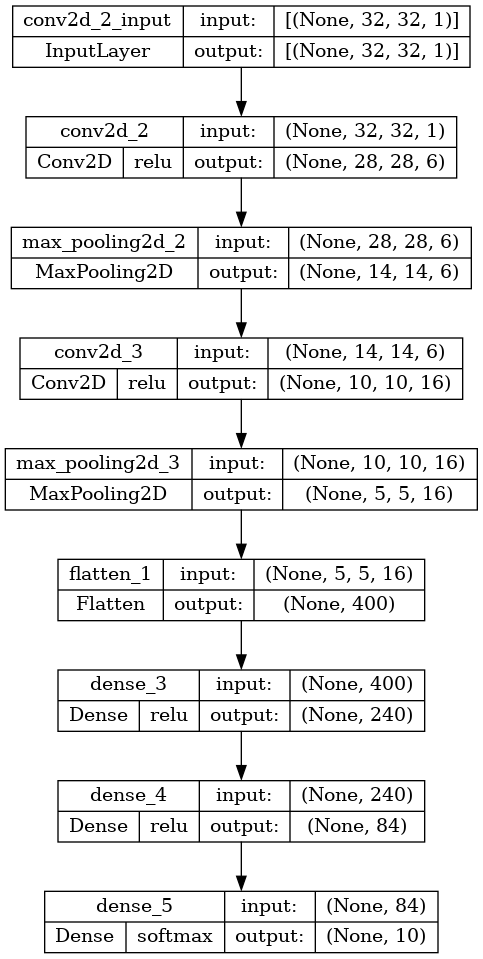

In [24]:
model = tuner.hypermodel.build(best_hps)
plot_model(model, show_shapes=True, show_layer_names=True, show_layer_activations=True)

### Train the model

In [25]:
# create general function 
def fit(X_train, y_train, X_val, y_val):
  stop_early = EarlyStopping(patience=5)
  lr_scheduler = LearningRateScheduler(scheduler)
  model = tuner.hypermodel.build(best_hps)
  history = model.fit(X_train, y_train, epochs=20, batch_size=50, validation_data=(X_val, y_val), callbacks=[stop_early, lr_scheduler])
  return history, model

In [26]:
history, _ = fit(X_train_tune, y_train_tune, X_val_tune, y_val_tune)

Epoch 1/20
1026/1026 [==============================] - 20s 19ms/step - loss: 0.5394 - accuracy: 0.8012 - val_loss: 0.4062 - val_accuracy: 0.8495 - lr: 0.0010
Epoch 2/20
1026/1026 [==============================] - 19s 19ms/step - loss: 0.3637 - accuracy: 0.8668 - val_loss: 0.3509 - val_accuracy: 0.8768 - lr: 0.0010
Epoch 3/20
1026/1026 [==============================] - 19s 19ms/step - loss: 0.3172 - accuracy: 0.8831 - val_loss: 0.2987 - val_accuracy: 0.8906 - lr: 0.0010
Epoch 4/20
1026/1026 [==============================] - 19s 19ms/step - loss: 0.2856 - accuracy: 0.8947 - val_loss: 0.2828 - val_accuracy: 0.8971 - lr: 0.0010
Epoch 5/20
1026/1026 [==============================] - 20s 19ms/step - loss: 0.2637 - accuracy: 0.9018 - val_loss: 0.2598 - val_accuracy: 0.9045 - lr: 0.0010
Epoch 6/20
1026/1026 [==============================] - 20s 19ms/step - loss: 0.2430 - accuracy: 0.9094 - val_loss: 0.2799 - val_accuracy: 0.8961 - lr: 0.0010
Epoch 7/20
1026/1026 [========================

In [27]:
# find best epoch
val_acc_per_epoch = history.history['val_accuracy']
best_epoch = val_acc_per_epoch.index(max(val_acc_per_epoch)) + 1
print('Best epoch: %d' % (best_epoch,))

Best epoch: 14


#### Diaplay Graphs

In [28]:
def display_accuracy(history):
    plt.figure(figsize=(5,5))
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model Accuracy')
    plt.ylabel('Accuracies')
    plt.xlabel('Epochs')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

In [29]:
def display_losses(history):
    plt.figure(figsize=(5,5))
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss')
    plt.ylabel('Losses')
    plt.xlabel('Epochs')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

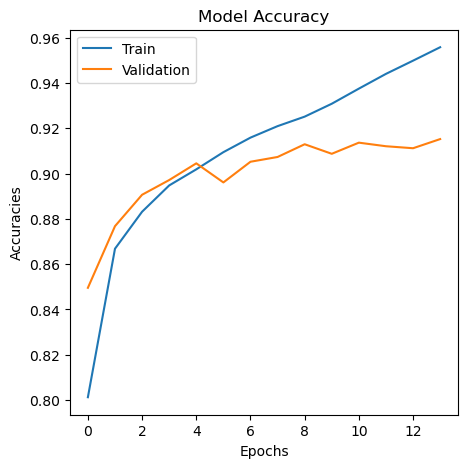

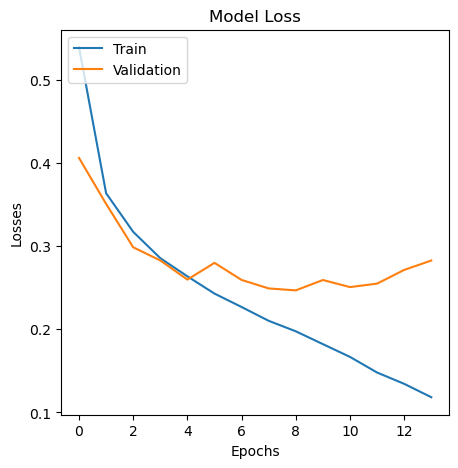

In [30]:
def displayGraphs(history):
  display_accuracy(history)
  print()
  display_losses(history)

displayGraphs(history)

### Evaluate the model

In [31]:
# check model generalization
score = model.evaluate(X_test, y_test)
print(score)
print(f'Score for: {model.metrics_names[0]} of {score[0]}; {model.metrics_names[1]} of {score[1] * 100}%')

94/94 [==============================] - 1s 5ms/step - loss: 2.3050 - accuracy: 0.0907
[2.3050105571746826, 0.09072715044021606]
Score for: loss of 2.3050105571746826; accuracy of 9.072715044021606%


### Cross-Validation
using the KFold

In [33]:
num_folds = 5
kfold = KFold(n_splits=num_folds, shuffle=True, random_state=seed)

In [34]:
fold = 1
models = []
accuracies = []
losses = []
for train, val in kfold.split(X_train, y_train):

  print('*********************************************************************')
  print(f'Start of fold {fold} ...')
  print()

  # Fit data to new model
  history, model = fit(X_train[train], y_train[train], X_train[val], y_train[val])

  # check model generalization
  scores = model.evaluate(X_test, y_test)
  print(scores)
  print(f'Score for fold {fold}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]*100}%')

  models.append(model)
  accuracies.append(scores[1] * 100)
  losses.append(scores[0])

  print()
  print(f'End of fold {fold} ...')
  print('*********************************************************************')

  # Increase fold number
  fold = fold + 1

*********************************************************************
Start of fold 1 ...

Epoch 1/20
912/912 [==============================] - 19s 20ms/step - loss: 0.5604 - accuracy: 0.7960 - val_loss: 0.4441 - val_accuracy: 0.8378 - lr: 0.0010
Epoch 2/20
912/912 [==============================] - 18s 20ms/step - loss: 0.3707 - accuracy: 0.8672 - val_loss: 0.3430 - val_accuracy: 0.8723 - lr: 0.0010
Epoch 3/20
912/912 [==============================] - 18s 19ms/step - loss: 0.3217 - accuracy: 0.8814 - val_loss: 0.3224 - val_accuracy: 0.8824 - lr: 0.0010
Epoch 4/20
912/912 [==============================] - 18s 19ms/step - loss: 0.2894 - accuracy: 0.8918 - val_loss: 0.3047 - val_accuracy: 0.8877 - lr: 0.0010
Epoch 5/20
912/912 [==============================] - 18s 19ms/step - loss: 0.2651 - accuracy: 0.9011 - val_loss: 0.2883 - val_accuracy: 0.8900 - lr: 0.0010
Epoch 6/20
912/912 [==============================] - 18s 19ms/step - loss: 0.2462 - accuracy: 0.9086 - val_loss: 0.3143 - v

#### Display Graphs

In [35]:
def display_fold_accuracy(folds, accuracies):
    plt.figure(figsize=(5,5))
    plt.plot(folds, accuracies)
    # make axis as discrete values
    plt.gca().xaxis.set_major_locator(mticker.MultipleLocator(1))
    plt.title('Model Accuracy')
    plt.ylabel('Accuracies')
    plt.xlabel('Folds')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

In [36]:
def display_fold_loss(folds, losses):
    plt.figure(figsize=(5,5))
    plt.plot(folds, losses)
    # make axis as discrete values
    plt.gca().xaxis.set_major_locator(mticker.MultipleLocator(1))
    plt.title('Model Loss')
    plt.ylabel('Losses')
    plt.xlabel('Folds')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

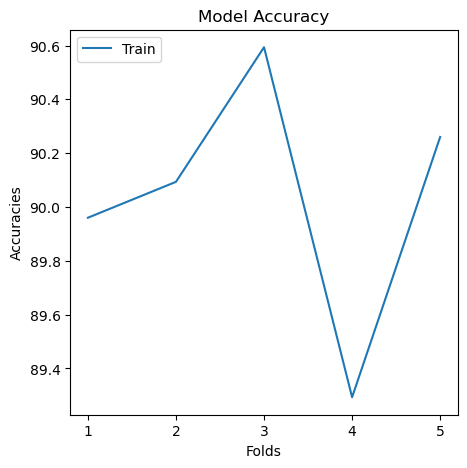

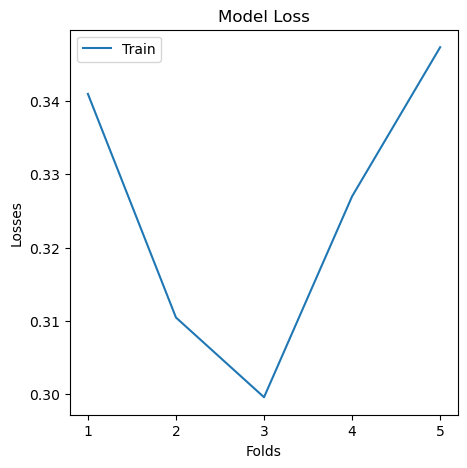

In [37]:
display_fold_accuracy(range(1, num_folds+1), accuracies)
print()
display_fold_loss(range(1, num_folds+1), losses)

Graphs show the best evaluation accuracy and loss for each model during the cross validation process

---

## Transfer Learning
replace the fully connected layer of a pre-trained model with a fully connected layer suitable with our problem

I will the following three pre-trained model

| Model | Top-1 Accuracy | Top-5 Accuracy | Parameters |
| --- | --- | --- | --- |
| VGG19 | 71.3%	 | 90.0% | 143.7M |
| RESNet152V2 | 78.0%	| 94.2% | 60.4M |
| DenseNet201 | 77.3% | 93.6% | 20.2M	|

(source: https://keras.io/api/applications/)

### VGG19

use a pretrained VGG19 and replace its fully connected network with a new one that I hope it will produce a good accuracy.

#### Build model

In [39]:
from keras.applications import VGG19

def VGG19_builder():

    # convert the 1 dimension gray image to 3 duplicated dimensions to be able to pass them to the model
    img_input = Input(shape=(img_size_target, img_size_target, 1))
    img_conc = Concatenate()([img_input, img_input, img_input])  

    # create the base pre-trained model
    base_model = VGG19(weights='imagenet', include_top=False, input_tensor=img_conc)

    x = base_model.output
    # adding a average pooling layer
    x = GlobalMaxPooling2D()(x)
    # adding a fully-connected layer with relu activation
    x = Dense(256, activation='relu')(x)
    # adding a dropout layer
    x = Dropout(0.4)(x)
    # adding a fully-connected layer with relu activation
    x = Dense(128, activation='relu')(x)
    # adding a dropout layer
    # x = Dropout(0.4)(x)
    # adding the output layer which has 10 classes with a softmax
    predictions = Dense(10, activation='softmax')(x)

    # this is the model we will train
    model = Model(inputs=base_model.input, outputs=predictions)

    # first: train only the top layers (which were randomly initialized)
    # i.e. freeze all convolutional InceptionV3 layers
    for layer in base_model.layers:
        layer.trainable = False

    model.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                  loss=SparseCategoricalCrossentropy(),
                  metrics=['accuracy'])

    return model

#### Display the model

80134624/80134624 [==============================] - 4s 0us/step


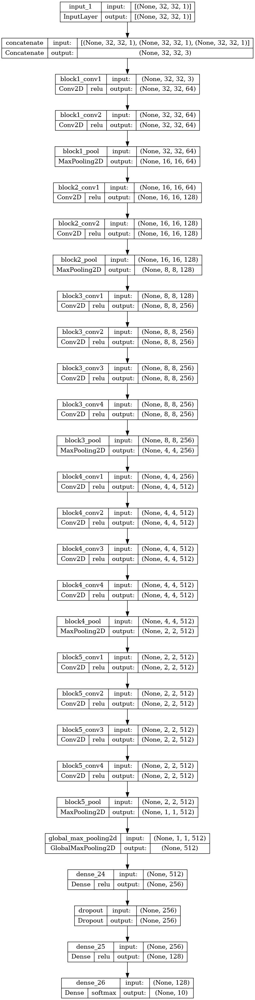

In [40]:
vgg19_model = VGG19_builder()
plot_model(vgg19_model, show_shapes=True, show_layer_names=True, show_layer_activations=True)

#### Train the model

In [41]:
stop_early = EarlyStopping(patience=5)
lr_scheduler = LearningRateScheduler(scheduler)
vgg_history = vgg19_model.fit(X_train_tune, y_train_tune, epochs=20, batch_size=50, validation_data=(X_val_tune, y_val_tune), callbacks=[stop_early, lr_scheduler])

Epoch 1/20
1026/1026 [==============================] - 395s 384ms/step - loss: 0.6417 - accuracy: 0.7691 - val_loss: 0.4370 - val_accuracy: 0.8408 - lr: 0.0010
Epoch 2/20
1026/1026 [==============================] - 383s 373ms/step - loss: 0.4797 - accuracy: 0.8230 - val_loss: 0.4029 - val_accuracy: 0.8481 - lr: 0.0010
Epoch 3/20
1026/1026 [==============================] - 367s 357ms/step - loss: 0.4429 - accuracy: 0.8381 - val_loss: 0.3626 - val_accuracy: 0.8659 - lr: 0.0010
Epoch 4/20
1026/1026 [==============================] - 368s 358ms/step - loss: 0.4220 - accuracy: 0.8449 - val_loss: 0.3707 - val_accuracy: 0.8606 - lr: 0.0010
Epoch 5/20
1026/1026 [==============================] - 384s 374ms/step - loss: 0.4091 - accuracy: 0.8509 - val_loss: 0.3687 - val_accuracy: 0.8675 - lr: 0.0010
Epoch 6/20
1026/1026 [==============================] - 395s 385ms/step - loss: 0.3969 - accuracy: 0.8544 - val_loss: 0.3649 - val_accuracy: 0.8683 - lr: 0.0010
Epoch 7/20
1026/1026 [============

#### Evaluate the model

In [42]:
# check model generalization
vgg_scores = vgg19_model.evaluate(X_test, y_test)
print(vgg_scores)
print(f'Score for: {vgg19_model.metrics_names[0]} of {vgg_scores[0]}; {vgg19_model.metrics_names[1]} of {vgg_scores[1] * 100}%')

94/94 [==============================] - 21s 224ms/step - loss: 0.3556 - accuracy: 0.8793
[0.3555738925933838, 0.8792528510093689]
Score for: loss of 0.3555738925933838; accuracy of 87.92528510093689%


#### Display graphs

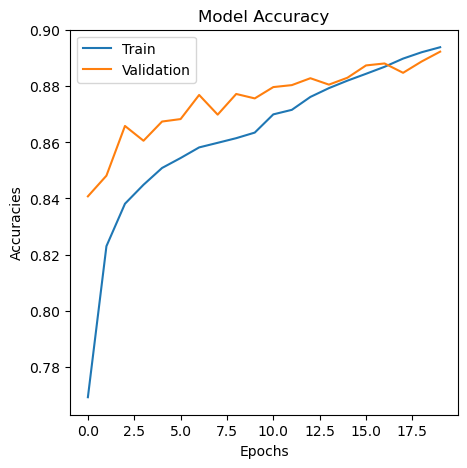

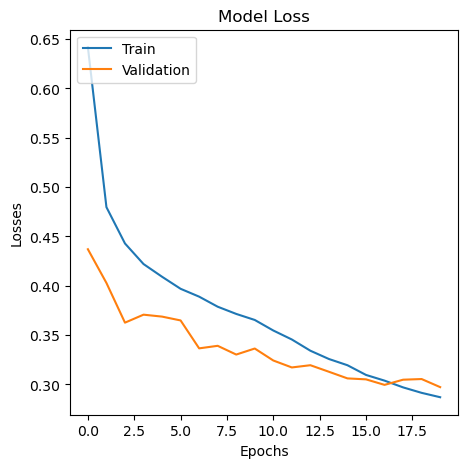

In [43]:
displayGraphs(vgg_history)

### RESNet152V2

use a pretrained RESNet152V2 and replace its fully connected network with a new one that I hope it will produce a good accuracy.

#### Build model

In [44]:
from keras.applications import ResNet152V2

def ResNet_builder():

    # convert the 1 dimension gray image to 3 duplicated dimensions to be able to pass them to the model
    img_input = Input(shape=(img_size_target, img_size_target, 1))
    img_conc = Concatenate()([img_input, img_input, img_input])  

    # create the base pre-trained model
    base_model = ResNet152V2(weights='imagenet', include_top=False, input_tensor=img_conc)

    x = base_model.output
    # adding a average pooling layer
    x = GlobalMaxPooling2D()(x)
    # adding a fully-connected layer with relu activation
    x = Dense(1024, activation='relu')(x)
    # adding a dropout layer
    x = Dropout(0.4)(x)
    # adding a fully-connected layer with relu activation
    x = Dense(512, activation='relu')(x)
    # adding a dropout layer
    x = Dropout(0.4)(x)
    # adding a fully-connected layer with relu activation
    x = Dense(128, activation='relu')(x)
    # adding the output layer which has 10 classes with a softmax
    predictions = Dense(10, activation='softmax')(x)

    # this is the model we will train
    model = Model(inputs=base_model.input, outputs=predictions)

    # first: train only the top layers (which were randomly initialized)
    # i.e. freeze all convolutional InceptionV3 layers
    for layer in base_model.layers:
        layer.trainable = False

    model.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                  loss=SparseCategoricalCrossentropy(),
                  metrics=['accuracy'])

    return model

#### Display the model

234545216/234545216 [==============================] - 9s 0us/step


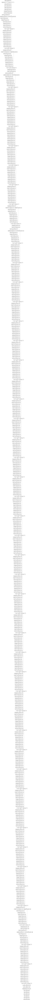

In [45]:
resnet_model = ResNet_builder()
plot_model(resnet_model, show_shapes=True, show_layer_names=True, show_layer_activations=True)

#### Train the model

In [47]:
stop_early = EarlyStopping(patience=5)
lr_scheduler = LearningRateScheduler(scheduler)
res_history = resnet_model.fit(X_train_tune, y_train_tune, epochs=10, batch_size=50, validation_data=(X_val_tune, y_val_tune), callbacks=[stop_early, lr_scheduler])

Epoch 1/10
1026/1026 [==============================] - 342s 333ms/step - loss: 0.6245 - accuracy: 0.7707 - val_loss: 0.5709 - val_accuracy: 0.7870 - lr: 0.0010
Epoch 2/10
1026/1026 [==============================] - 351s 342ms/step - loss: 0.5817 - accuracy: 0.7850 - val_loss: 0.5704 - val_accuracy: 0.7888 - lr: 0.0010
Epoch 3/10
1026/1026 [==============================] - 338s 330ms/step - loss: 0.5572 - accuracy: 0.7928 - val_loss: 0.5575 - val_accuracy: 0.7920 - lr: 0.0010
Epoch 4/10
1026/1026 [==============================] - 338s 330ms/step - loss: 0.5331 - accuracy: 0.8026 - val_loss: 0.5395 - val_accuracy: 0.8016 - lr: 0.0010
Epoch 5/10
1026/1026 [==============================] - 349s 341ms/step - loss: 0.5138 - accuracy: 0.8089 - val_loss: 0.5506 - val_accuracy: 0.7974 - lr: 0.0010
Epoch 6/10
1026/1026 [==============================] - 350s 341ms/step - loss: 0.5003 - accuracy: 0.8134 - val_loss: 0.5414 - val_accuracy: 0.8074 - lr: 0.0010
Epoch 7/10
1026/1026 [============

#### Evaluate the model

In [49]:
# check model generalization
res_scores = resnet_model.evaluate(X_test, y_test)
print(res_scores)
print(f'Score for: {resnet_model.metrics_names[0]} of {res_scores[0]}; {resnet_model.metrics_names[1]} of {res_scores[1] * 100}%')

94/94 [==============================] - 20s 210ms/step - loss: 0.5768 - accuracy: 0.8025
[0.5768388509750366, 0.8025349974632263]
Score for: loss of 0.5768388509750366; accuracy of 80.25349974632263%


#### Display graphs

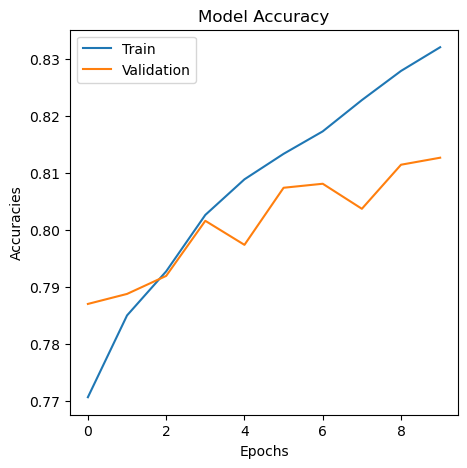

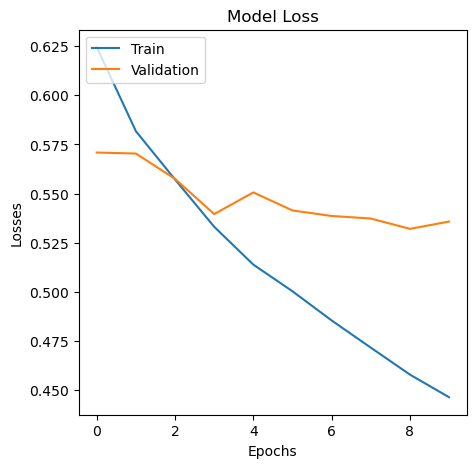

In [50]:
displayGraphs(res_history)

### DenseNet201

use a pretrained DenseNet201 and replace its fully connected network with a new one that I hope it will produce a good accuracy.

#### Build model

In [51]:
from keras.applications import DenseNet201

def DenseNet_builder():

    # convert the 1 dimension gray image to 3 duplicated dimensions to be able to pass them to the model
    img_input = Input(shape=(img_size_target, img_size_target, 1))
    img_conc = Concatenate()([img_input, img_input, img_input])  

    # create the base pre-trained model
    base_model = DenseNet201(weights='imagenet', include_top=False, input_tensor=img_conc)

    x = base_model.output
    # adding a average pooling layer
    x = GlobalMaxPooling2D()(x)
    # adding a fully-connected layer with relu activation
    x = Dense(1024, activation='relu')(x)
    # adding a dropout layer
    x = Dropout(0.4)(x)
    # adding a fully-connected layer with relu activation
    x = Dense(512, activation='relu')(x)
    # adding a dropout layer
    x = Dropout(0.4)(x)
    # adding a fully-connected layer with relu activation
    x = Dense(128, activation='relu')(x)
    # adding the output layer which has 10 classes with a softmax
    predictions = Dense(10, activation='softmax')(x)

    # this is the model we will train
    model = Model(inputs=base_model.input, outputs=predictions)

    # first: train only the top layers (which were randomly initialized)
    # i.e. freeze all convolutional InceptionV3 layers
    for layer in base_model.layers:
        layer.trainable = False

    model.compile(optimizer=Adam(learning_rate=initial_learning_rate),
                  loss=SparseCategoricalCrossentropy(),
                  metrics=['accuracy'])

    return model

#### Display the model

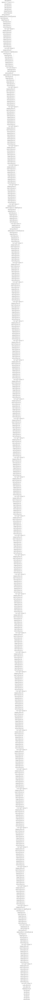

In [52]:
densenet_model = ResNet_builder()
plot_model(densenet_model, show_shapes=True, show_layer_names=True, show_layer_activations=True)

#### Train the model

In [53]:
stop_early = EarlyStopping(patience=5)
lr_scheduler = LearningRateScheduler(scheduler)
dense_history = densenet_model.fit(X_train_tune, y_train_tune, epochs=10, batch_size=50, validation_data=(X_val_tune, y_val_tune), callbacks=[stop_early, lr_scheduler])

Epoch 1/10
1026/1026 [==============================] - 362s 343ms/step - loss: 0.8143 - accuracy: 0.7065 - val_loss: 0.6140 - val_accuracy: 0.7767 - lr: 0.0010
Epoch 2/10
1026/1026 [==============================] - 333s 325ms/step - loss: 0.6444 - accuracy: 0.7639 - val_loss: 0.5919 - val_accuracy: 0.7791 - lr: 0.0010
Epoch 3/10
1026/1026 [==============================] - 323s 314ms/step - loss: 0.6006 - accuracy: 0.7779 - val_loss: 0.5690 - val_accuracy: 0.7956 - lr: 0.0010
Epoch 4/10
1026/1026 [==============================] - 321s 313ms/step - loss: 0.5684 - accuracy: 0.7917 - val_loss: 0.5498 - val_accuracy: 0.7963 - lr: 0.0010
Epoch 5/10
1026/1026 [==============================] - 326s 318ms/step - loss: 0.5424 - accuracy: 0.7989 - val_loss: 0.5615 - val_accuracy: 0.7876 - lr: 0.0010
Epoch 6/10
1026/1026 [==============================] - 331s 323ms/step - loss: 0.5240 - accuracy: 0.8038 - val_loss: 0.5537 - val_accuracy: 0.8018 - lr: 0.0010
Epoch 7/10
1026/1026 [============

#### Evaluate the model

In [54]:
# check model generalization
dense_scores = densenet_model.evaluate(X_test, y_test)
print(dense_scores)
print(f'Score for: {densenet_model.metrics_names[0]} of {dense_scores[0]}; {densenet_model.metrics_names[1]} of {dense_scores[1] * 100}%')

94/94 [==============================] - 20s 208ms/step - loss: 0.5560 - accuracy: 0.8059
[0.5560103058815002, 0.8058705925941467]
Score for: loss of 0.5560103058815002; accuracy of 80.58705925941467%


#### Display graphs

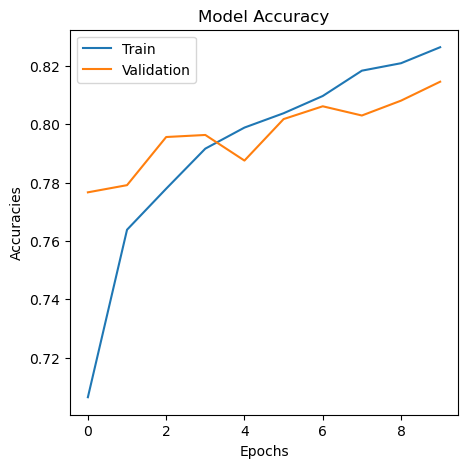

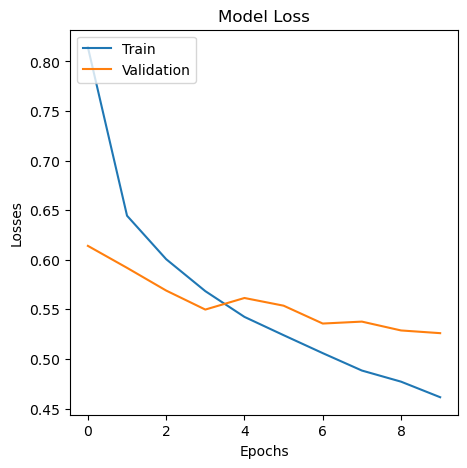

In [55]:
displayGraphs(dense_history)